In [1]:
import torch
from pathlib import Path
import requests

DATA_PATH = Path("data/")

IMAGE_PATH = DATA_PATH / "pizza-steak-sushi"

if IMAGE_PATH.is_dir():
  pass
else:
  print(f"Creating the {IMAGE_PATH} directory...")
  IMAGE_PATH.mkdir(exist_ok=True, parents=True)

with open(DATA_PATH / "pizza-steak-sushi.zip", 'wb') as f:
  request = requests.get("https://github.com/mrdbourke/pytorch-deep-learning/raw/refs/heads/main/data/pizza_steak_sushi.zip")
  f.write(request.content)

Creating the data/pizza-steak-sushi directory...


In [2]:
import zipfile

with zipfile.ZipFile(DATA_PATH / "pizza-steak-sushi.zip", 'r') as zip_ref:
  print("Unzipping the pizza, sushi and steak...")
  zip_ref.extractall(IMAGE_PATH)

Unzipping the pizza, sushi and steak...


In [3]:
import os
def walk_dir(dir_path):
  """young jesus"""
  for dirpath, dirnames, filenames in os.walk(dir_path):
    print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'")

In [4]:
walk_dir(IMAGE_PATH)

There are 2 directories and 0 images in 'data/pizza-steak-sushi'
There are 3 directories and 0 images in 'data/pizza-steak-sushi/train'
There are 0 directories and 75 images in 'data/pizza-steak-sushi/train/steak'
There are 0 directories and 78 images in 'data/pizza-steak-sushi/train/pizza'
There are 0 directories and 72 images in 'data/pizza-steak-sushi/train/sushi'
There are 3 directories and 0 images in 'data/pizza-steak-sushi/test'
There are 0 directories and 19 images in 'data/pizza-steak-sushi/test/steak'
There are 0 directories and 25 images in 'data/pizza-steak-sushi/test/pizza'
There are 0 directories and 31 images in 'data/pizza-steak-sushi/test/sushi'


In [5]:
train_dir = IMAGE_PATH / "train"
test_dir = IMAGE_PATH / "test"

Image name is sushi
Image height is 512
Image width is 512


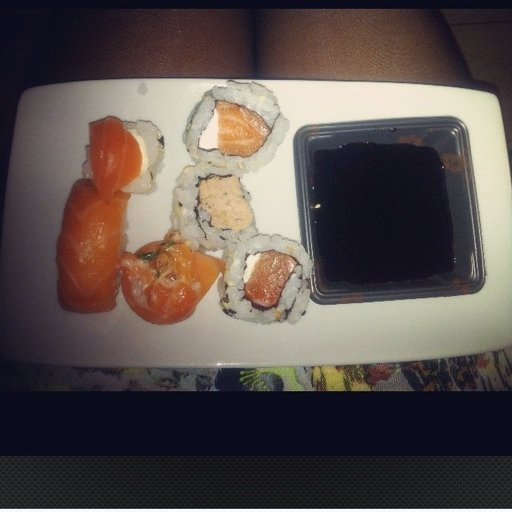

In [6]:
import random
from PIL import Image
image_path_list = list(IMAGE_PATH.glob('*/*/*.jpg'))
random_image_path = random.choice(image_path_list)
random_image_path

img = Image.open(random_image_path)
img_class = random_image_path.parent.stem
print(f'Image name is {img_class}')
print(f'Image height is {img.height}')
print(f'Image width is {img.width}')
img

<Figure size 1400x900 with 0 Axes>

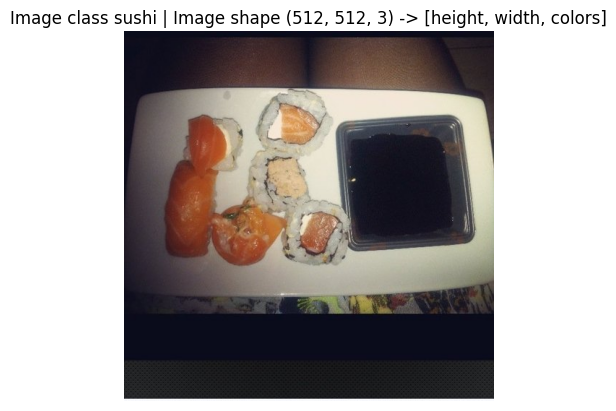

<Figure size 1400x900 with 0 Axes>

In [7]:
import matplotlib.pyplot as plt
import numpy as np

img_as_array = np.asarray(img)
plt.imshow(img_as_array)
plt.title(f"Image class {img_class} | Image shape {img_as_array.shape} -> [height, width, colors]")
plt.axis(False)
plt.figure(figsize=(14,9))

array([[[  9,  12,  27],
        [  9,  12,  27],
        [  9,  12,  27],
        ...,
        [ 12,  11,  27],
        [ 12,  11,  27],
        [ 12,  11,  27]],

       [[  9,  12,  27],
        [  9,  12,  27],
        [  9,  12,  27],
        ...,
        [ 13,  12,  28],
        [ 13,  12,  28],
        [ 13,  12,  28]],

       [[  9,  12,  27],
        [  9,  12,  27],
        [  9,  12,  27],
        ...,
        [ 10,  12,  27],
        [ 10,  12,  27],
        [ 10,  12,  27]],

       ...,

       [[253, 254, 255],
        [254, 255, 255],
        [254, 255, 255],
        ...,
        [254, 255, 255],
        [254, 255, 255],
        [253, 254, 255]],

       [[246, 247, 251],
        [247, 248, 252],
        [243, 244, 248],
        ...,
        [246, 247, 251],
        [246, 247, 251],
        [246, 247, 251]],

       [[249, 250, 254],
        [250, 251, 255],
        [246, 247, 251],
        ...,
        [251, 252, 255],
        [250, 251, 255],
        [249, 250, 254]]], dtype=uint8)
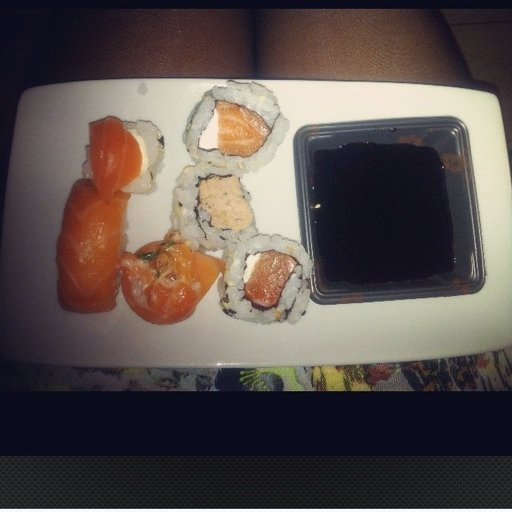

In [8]:
img_as_array

In [9]:
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

data_transform = transforms.Compose([
    transforms.Resize(size=(64,64)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor()
])

data_transform(img)

tensor([[[0.0392, 0.0392, 0.0392,  ..., 0.0471, 0.0471, 0.0471],
         [0.0549, 0.0549, 0.0549,  ..., 0.1137, 0.1098, 0.1059],
         [0.0510, 0.0510, 0.0510,  ..., 0.1255, 0.1255, 0.1216],
         ...,
         [0.1412, 0.1412, 0.1412,  ..., 0.1412, 0.1412, 0.1412],
         [0.1451, 0.1412, 0.1412,  ..., 0.1412, 0.1412, 0.1451],
         [0.4078, 0.4078, 0.4039,  ..., 0.4039, 0.4078, 0.4078]],

        [[0.0471, 0.0471, 0.0471,  ..., 0.0510, 0.0510, 0.0510],
         [0.0510, 0.0510, 0.0549,  ..., 0.0941, 0.0941, 0.0863],
         [0.0510, 0.0510, 0.0510,  ..., 0.0980, 0.0980, 0.0902],
         ...,
         [0.1451, 0.1451, 0.1451,  ..., 0.1451, 0.1451, 0.1451],
         [0.1490, 0.1490, 0.1451,  ..., 0.1451, 0.1451, 0.1490],
         [0.4118, 0.4118, 0.4078,  ..., 0.4078, 0.4118, 0.4118]],

        [[0.1059, 0.1059, 0.1059,  ..., 0.1059, 0.1059, 0.1059],
         [0.1059, 0.1059, 0.1098,  ..., 0.1333, 0.1294, 0.1255],
         [0.1098, 0.1137, 0.1098,  ..., 0.1294, 0.1294, 0.

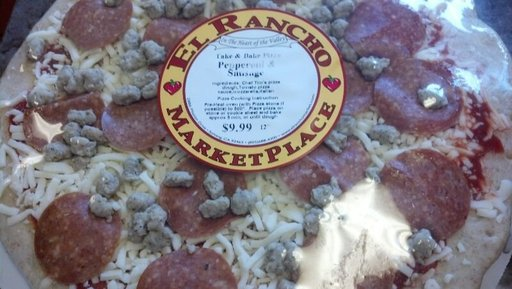

In [10]:
Image.open(image_path_list[78])

In [11]:
def plot_transform_images(
    image_path_list: list,
    transform,
    n=3,
    seed=None
):
  if seed:
    torch.manual_seed(seed)
  rand_img_path_list = random.sample(image_path_list, k=n)
  for rand_img in rand_img_path_list:
    with Image.open(rand_img) as f:
      fig, ax = plt.subplots(nrows=1, ncols=2)
      ax[0].imshow(f)
      ax[0].set_title(f"Original Image\nSize: {f.size}")
      ax[0].axis(False)

      transformed_img = transform(f).permute(1,2,0)
      ax[1].imshow(transformed_img)
      ax[1].set_title(f"Transformed Image\nShape: {transformed_img.shape}")
      ax[1].axis("off")

      class_name = rand_img.parent.stem
      fig.suptitle(f"Class: {class_name}", fontsize=16)


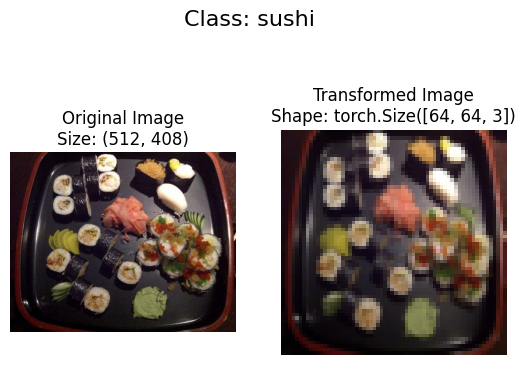

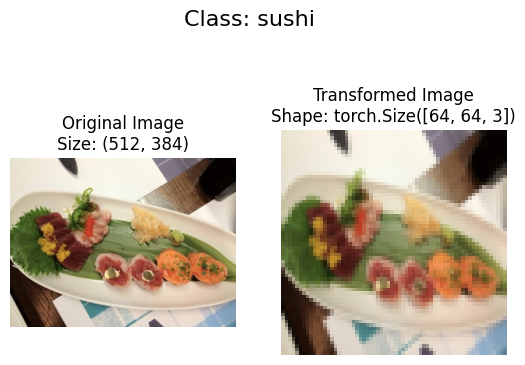

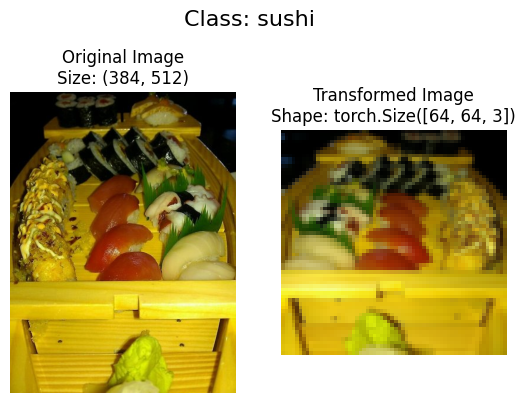

In [12]:
plot_transform_images(image_path_list, data_transform, seed=42)

In [13]:
train_data = datasets.ImageFolder(root=train_dir,
                                  transform=data_transform,
                                  target_transform=None)

test_data = datasets.ImageFolder(root=test_dir,
                                 transform=data_transform)

In [14]:
len(train_data), len(test_data)

(225, 75)

In [15]:
img, label = train_data[0][0], train_data[0][1]

print(f"Train data shape -> {img.size}")
print(f"Image shape -> {img.shape}")
print(f"Image dtype -> {img.dtype}")
print(f"Label type -> {type(label)}")
print(f"Image tensor -> {img}")

Train data shape -> <built-in method size of Tensor object at 0x7e3f67faa430>
Image shape -> torch.Size([3, 64, 64])
Image dtype -> torch.float32
Label type -> <class 'int'>
Image tensor -> tensor([[[0.1176, 0.1216, 0.1255,  ..., 0.0980, 0.1020, 0.1137],
         [0.1294, 0.1294, 0.1294,  ..., 0.0980, 0.0980, 0.1059],
         [0.1333, 0.1333, 0.1333,  ..., 0.0941, 0.0980, 0.1020],
         ...,
         [0.1686, 0.1647, 0.1686,  ..., 0.1255, 0.1098, 0.1098],
         [0.1686, 0.1647, 0.1686,  ..., 0.1098, 0.0941, 0.0902],
         [0.1647, 0.1647, 0.1686,  ..., 0.0980, 0.0863, 0.0863]],

        [[0.0588, 0.0588, 0.0588,  ..., 0.0745, 0.0706, 0.0745],
         [0.0627, 0.0627, 0.0627,  ..., 0.0745, 0.0706, 0.0745],
         [0.0706, 0.0706, 0.0706,  ..., 0.0745, 0.0745, 0.0706],
         ...,
         [0.2392, 0.2392, 0.2510,  ..., 0.1373, 0.1333, 0.1255],
         [0.2314, 0.2392, 0.2510,  ..., 0.1255, 0.1176, 0.1098],
         [0.2275, 0.2353, 0.2431,  ..., 0.1137, 0.1059, 0.1020]],

In [16]:
class_dict = train_data.class_to_idx

In [17]:
class_names = train_data.classes


In [18]:
img_permuted = img.permute(1,2,0)

(-0.5, 63.5, 63.5, -0.5)

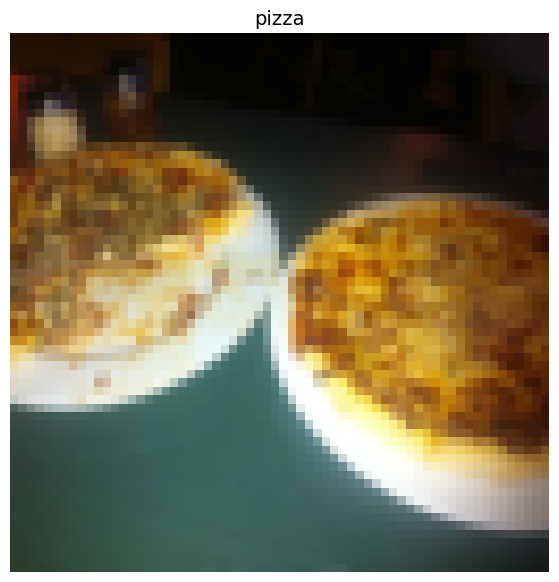

In [19]:
plt.figure(figsize=(10,7))
plt.title(class_names[label], fontsize=14)
plt.imshow(img_permuted)
plt.axis("off")

In [20]:
class_dict

{'pizza': 0, 'steak': 1, 'sushi': 2}

In [21]:
from torch.utils.data import DataLoader

BATCH_SIZE = 32

train_dataloader = DataLoader(dataset=train_data,
                               batch_size=BATCH_SIZE,
                               num_workers=os.cpu_count())

test_dataloader = DataLoader(dataset=test_data,
                              batch_size=BATCH_SIZE,
                              num_workers=os.cpu_count())

In [22]:
len(train_dataloader), len(test_dataloader)

(8, 3)

In [23]:
img, label = next(iter(train_dataloader))

In [24]:
import os
def find_classes(target_dir: str):
  classes = sorted([entry.name for entry in list(os.scandir(target_dir)) if entry.is_dir()])

  if not classes:
    raise FileNotFoundError("Classes doesn't exist!")
  class_to_idx = {class_name: i for i, class_name in enumerate(classes)}

  return classes, class_to_idx

In [25]:
find_classes(train_dir)

(['pizza', 'steak', 'sushi'], {'pizza': 0, 'steak': 1, 'sushi': 2})

In [26]:
from torch.utils.data import Dataset
from typing import Tuple, List

In [27]:
class ImageFolderCustom(Dataset):
    def __init__(self, target_dir: str, transform=None):
        self.paths = list(Path(target_dir).glob("*/*.jpg"))  # expects train/pizza/image.jpg
        self.transform = transform
        self.classes, self.class_to_idx = find_classes(target_dir)

    def load_image(self, idx: int):
        img_path = self.paths[idx]
        return Image.open(img_path)

    def __len__(self) -> int:
        return len(self.paths)

    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, int]:  # Update the return type
        self.img = self.load_image(idx)
        self.class_name = self.paths[idx].parent.name
        self.class_idx = self.class_to_idx[self.class_name]

        if self.transform:
            self.img = self.transform(self.img)

        return self.img, self.class_idx # Return class name along with image and index


In [28]:
from torchvision import transforms
train_transforms = transforms.Compose([transforms.Resize(size=(64,64)),
                                      transforms.RandomHorizontalFlip(p=0.5),
                                      transforms.ToTensor()])

test_transforms = transforms.Compose([transforms.Resize(size=(64,64)),
                                     transforms.RandomHorizontalFlip(p=0.5),
                                     transforms.ToTensor()])

In [29]:
train_data_custom = ImageFolderCustom(target_dir = train_dir,
                                      transform = train_transforms)

test_data_custom = ImageFolderCustom(target_dir = test_dir,
                                      transform = train_transforms)

In [30]:
train_data_custom.classes

['pizza', 'steak', 'sushi']

torch.Size([3, 64, 64])


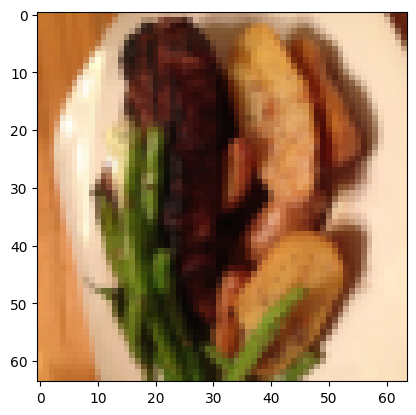

In [31]:
img, class_idx= train_data_custom.__getitem__(2)

print(img.shape)  # This will print the class name.
img = img.permute(2,1,0)
plt.imshow(img)

In [32]:
for data in train_data_custom:
  print(data)
  break

(tensor([[[0.2745, 0.3647, 0.2863,  ..., 0.2275, 0.2196, 0.2157],
         [0.2549, 0.3412, 0.3882,  ..., 0.2196, 0.2196, 0.2157],
         [0.3059, 0.3059, 0.4078,  ..., 0.1922, 0.1882, 0.2118],
         ...,
         [0.4078, 0.4196, 0.4275,  ..., 0.1373, 0.1451, 0.1490],
         [0.4078, 0.4078, 0.4039,  ..., 0.1255, 0.1373, 0.1529],
         [0.4039, 0.4039, 0.4000,  ..., 0.1216, 0.1255, 0.1294]],

        [[0.2784, 0.3255, 0.2549,  ..., 0.2510, 0.2549, 0.2510],
         [0.2431, 0.2902, 0.2980,  ..., 0.2549, 0.2588, 0.2588],
         [0.2392, 0.2431, 0.3020,  ..., 0.2314, 0.2275, 0.2392],
         ...,
         [0.2745, 0.2784, 0.2863,  ..., 0.1686, 0.1686, 0.1647],
         [0.2706, 0.2667, 0.2627,  ..., 0.1608, 0.1647, 0.1765],
         [0.2706, 0.2706, 0.2667,  ..., 0.1608, 0.1686, 0.1725]],

        [[0.2431, 0.2706, 0.2235,  ..., 0.2588, 0.2627, 0.2667],
         [0.2235, 0.2392, 0.2275,  ..., 0.2627, 0.2706, 0.2627],
         [0.2039, 0.2118, 0.2471,  ..., 0.2392, 0.2392, 0

In [33]:
from typing import Tuple

In [34]:
class_names

['pizza', 'steak', 'sushi']

In [35]:
def display_rand_img(dataset: torch.utils.data.Dataset,
                  class_names: List,
                  n: int = 10,
                  display_shape: bool = None,
                  seed: int = None):
  if seed:
    torch.manual_seed(42)
  if n > 10:
    n = 10
    print(f"Due to the n > 10, shape won't appear!")
    display_shape = False
  plt.figure(figsize=(14,6))
  target_samples_idx = random.sample(range(len(dataset)), k=n)
  for i, target_sample in enumerate(target_samples_idx):
    target_img, target_label = train_data[target_sample]
    targ_img_adjust = target_img.permute(1,2,0)
    plt.subplot(1, n, i+1)
    plt.imshow(targ_img_adjust)
    if class_names:
      title = f"Class: {class_names[target_label]}"
      if display_shape:
        title += f"\nShape: {targ_img_adjust.shape}"
    plt.title(title)
    plt.axis("off")

Due to the n > 10, shape won't appear!


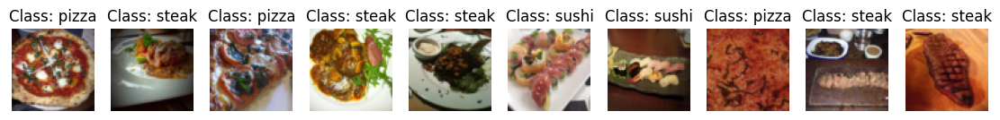

In [36]:
display_rand_img(train_data,
                 class_names=class_names,
                 n=1000000,
                 display_shape=True,
                 seed=42)

In [37]:
from torch.utils.data import DataLoader
import os

BATCH_SIZE = 32
train_dataloader_custom = DataLoader(train_data,
                                     batch_size=BATCH_SIZE,
                                     shuffle = True,
                                     num_workers=os.cpu_count())

test_dataloader_custom = DataLoader(test_data,
                                     batch_size=BATCH_SIZE,
                                     shuffle = True,
                                     num_workers=os.cpu_count())

In [38]:
train_dataloader_custom

In [39]:
img_custom, label_custom = next(iter(train_dataloader_custom))
img_custom.shape

torch.Size([32, 3, 64, 64])

In [40]:
from torchvision import transforms

train_transform = transforms.Compose([transforms.Resize(size=(224,224)),
                    transforms.TrivialAugmentWide(num_magnitude_bins=31),
                    transforms.ToTensor()])

test_transform = transforms.Compose([transforms.Resize(size=(224,224)),
                                    transforms.TrivialAugmentWide(num_magnitude_bins = 31),
                                    transforms.ToTensor()])


<ipython-input-11-4c28edcf2995>:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(nrows=1, ncols=2)


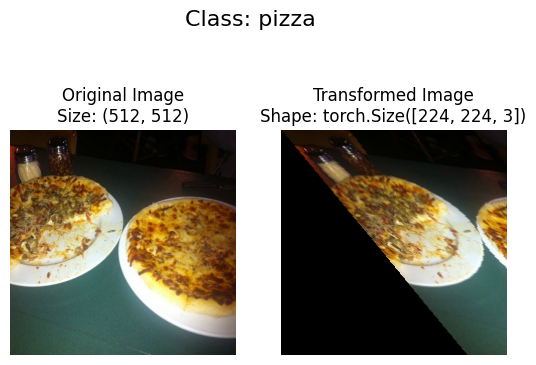

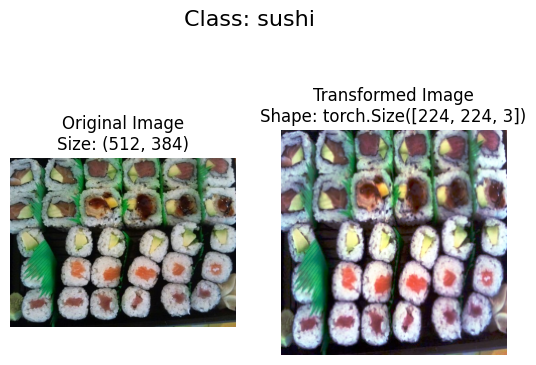

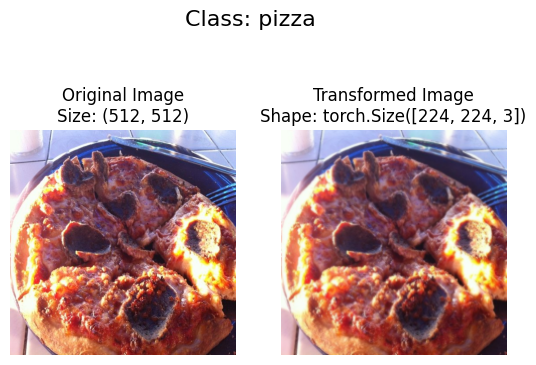

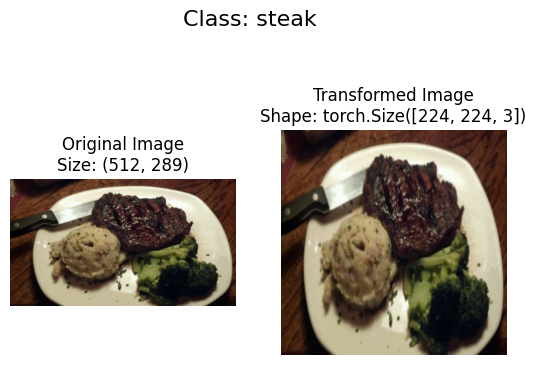

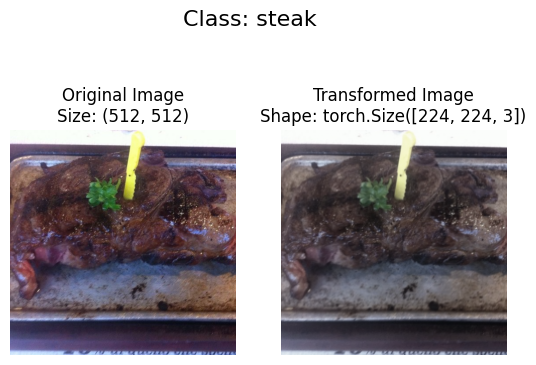

...

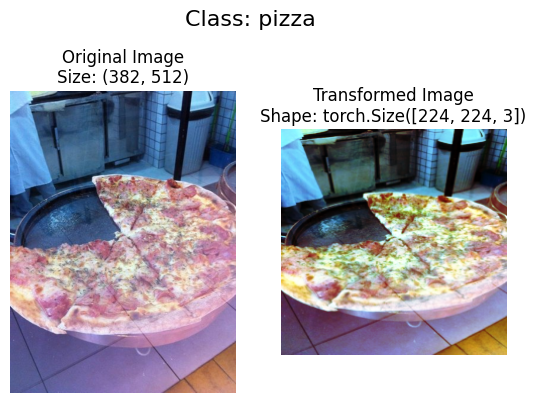

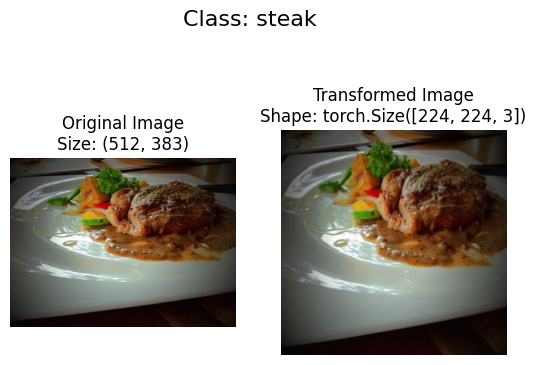

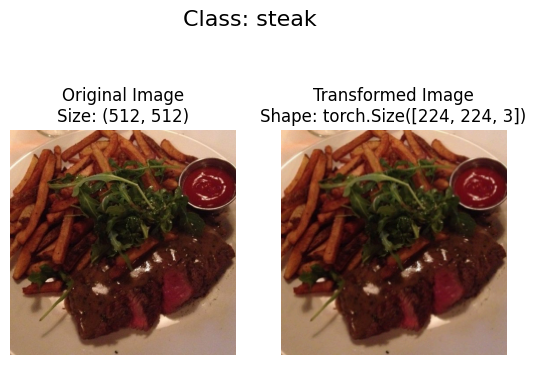

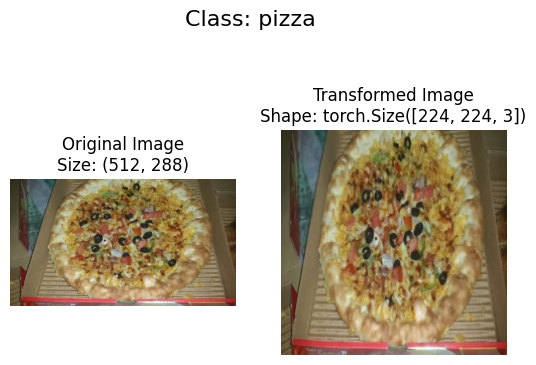

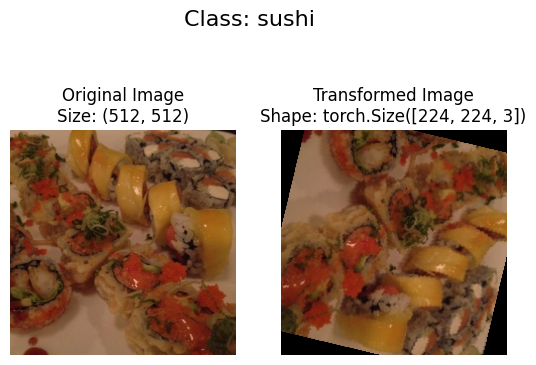

In [41]:
# plot the random images

plot_transform_images(
    transform=train_transform,
    image_path_list=image_path_list,
    n=30,
)

In [42]:
from torch import nn

In [111]:
class TinyVGG(nn.Module):
  def __init__(self,
               input_shape,
               hidden_units,
               output_shape):
    super().__init__()
    self.conv_block_1 = nn.Sequential(
        nn.Conv2d(input_shape,
                  hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=0),
        nn.ReLU(),

        nn.Conv2d(hidden_units,
                  hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=0),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2,
                     stride=2),
    )
    self.conv_block_2 = nn.Sequential(
        nn.Conv2d(hidden_units,
                  hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=0),
        nn.ReLU(),

        nn.Conv2d(hidden_units,
                  hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=0),
        nn.ReLU(),
        nn.MaxPool2d(
            kernel_size=2,
            stride=2)
        )

    self.classifier = nn.Sequential(
          nn.Flatten(),
          nn.Linear(in_features=hidden_units*13*13,
                    out_features=output_shape)
        )
  def forward(self, x):
      return self.classifier(self.conv_block_2(self.conv_block_1(x)))



In [112]:
class_names

['pizza', 'steak', 'sushi']

In [113]:
torch.manual_seed(42)
model_0 = TinyVGG(input_shape=3,
                  hidden_units=10,
                  output_shape=len(class_names))

model_0

TinyVGG(
  (conv_block_1): Sequential(
    (0): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_block_2): Sequential(
    (0): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=1690, out_features=3, bias=True)
  )
)

In [114]:
image_batch, label_batch = next(iter(train_dataloader_custom))
image_batch.shape, len(label_batch)

(torch.Size([32, 3, 64, 64]), 32)

In [115]:
# Try a forward pass
model_0(image_batch)

tensor([[ 2.0795e-02, -1.9510e-03,  9.5212e-03],
        [ 1.9347e-02,  3.1597e-03,  7.4474e-03],
        [ 1.7695e-02,  1.0282e-03,  9.4975e-03],
        [ 2.1068e-02, -2.6110e-03,  1.0277e-02],
        [ 1.9939e-02,  6.9131e-04,  1.0778e-02],
        [ 2.1281e-02,  2.0434e-03,  5.0046e-03],
        [ 2.0996e-02,  1.6415e-04,  1.2481e-02],
        [ 2.1566e-02, -1.9607e-03,  9.7175e-03],
        [ 2.4500e-02, -4.7904e-03,  8.5394e-03],
        [ 1.9275e-02, -1.7611e-04,  8.9663e-03],
        [ 1.9972e-02, -2.9622e-03,  8.2557e-03],
        [ 2.2318e-02, -2.1642e-03,  9.4428e-03],
        [ 2.1851e-02, -3.7225e-03,  8.3784e-03],
        [ 2.2881e-02, -1.7559e-03,  1.0299e-02],
        [ 2.1635e-02, -4.3995e-03,  9.4990e-03],
        [ 2.2589e-02, -3.4084e-03,  1.0640e-02],
        [ 2.0182e-02, -2.1775e-03,  9.5757e-03],
        [ 2.1698e-02, -2.7458e-03,  8.4966e-03],
        [ 1.9974e-02, -3.1665e-07,  8.4496e-03],
        [ 1.8308e-02,  1.6378e-03,  8.5491e-03],
        [ 1.7433e-02